In [2]:
!pip install opencv-python

     ---------------------------------------- 35.6/35.6 MB 3.8 MB/s eta 0:00:00


In [3]:
import cv2

In [17]:
import dlib

# 1. 파이썬 OpenCV를 이용한 얼굴 인식
- 출처 : https://deep-eye.tistory.com/18#google_vignette

#### 1. Haar Cascade 분류기 불러오기

In [5]:
# 가중치 파일 경로
cascade_filename = 'haarcascade_frontalface_alt.xml'

# 모델 불러오기
cascade = cv2.CascadeClassifier(cascade_filename)

- OpenCV에서 기본 라이브러리로 제공하는 Haar Cascade는 기계학습을 이용한 객체 탐지 알고리즘
- CNN이나 RSTM 등의 신경망이 아닌, 하르 특징 (Haar Features) 계산을 통해 객체를 찾dma
- 사전 학습된 분류기 (haarcascade_frontalface_alt.xml) 를 로드한 뒤, cv2를 통해 분류기를 생성

#### 2. Test 영상 & 사진 불러오기

In [7]:
# 영상 파일 
cam = cv2.VideoCapture('sample.mp4')
# 사진 파일
img = cv2.imread('sample.jpg')


# 영상 재생
def videoDetector(cam,cascade):
    
    while True:
        
        # 캡처 이미지 불러오기
        ret,img = cam.read()
        # 영상 압축
        img = cv2.resize(img,dsize=None,fx=0.75,fy=0.75)
        # 그레이 스케일 변환
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 


# 사진 출력
def imgDetector(img,cascade):

	img = cv2.resize(img,dsize=None,fx=0.5,fy=0.5)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 24)

- 영상 또는 사진 속 객체를 인식하기 위해, 기본 소스를 불러옴
- Cascading classifiers는 gray scale (흑백 영상)으로 변환된 뒤, 특징맵 분류기에 입력되므로 cvtColor를 통해 영상 전처리를 진행

#### 3. 얼굴 탐지 알고리즘 적용

In [ ]:
# cascade 얼굴 탐지 알고리즘 
results = cascade.detectMultiScale(gray,            # 입력 이미지
                                   scaleFactor= 1.5,# 이미지 피라미드 스케일 factor
                                   minNeighbors=5,  # 인접 객체 최소 거리 픽셀
                                   minSize=(20,20)  # 탐지 객체 최소 크기
                                   )        
                                   
# 결과값 = 탐지된 객체의 경계상자 list                                                                           
for box in results:
    # 좌표 추출       
    x, y, w, h = box
    # 경계 상자 그리기
    cv2.rectangle(img, (x,y), (x+w, y+h), (255,255,255), thickness=2)

- detectMultiScale을 통해 객체 탐지 알고리즘을 실행
- scaleFactor는 쉽게 말해, 그림 2와 같이 객체 탐지를 위해 이미지를 다양한 크기로 변형을 주는데, 이때의 변화 정도율 정도 생각하면 될 것 같음
- scaleFactor 값이 커지게 될 경우, 큼직큼직하게 변화시켜가며 분석하기 때문에 탐지 성공율은 떨어지지만, 연산량은 감소함

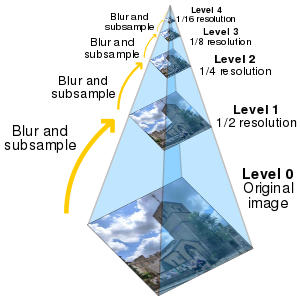

#### 4. 최종 응용 코드

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Wed Nov 4 
@author: jongwon Kim 
         Deep.I Inc.
"""


import cv2
import timeit

# 영상 검출기
def videoDetector(cam,cascade):
    
    while True:
        
        start_t = timeit.default_timer()
         # 알고리즘 시작 시점
        """ 알고리즘 연산 """
        
        # 캡처 이미지 불러오기
        ret,img = cam.read()
        # 영상 압축
        img = cv2.resize(img,dsize=None,fx=1.0,fy=1.0)
        # 그레이 스케일 변환
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
        # cascade 얼굴 탐지 알고리즘 
        results = cascade.detectMultiScale(gray,            # 입력 이미지
                                           scaleFactor= 1.1,# 이미지 피라미드 스케일 factor
                                           minNeighbors=5,  # 인접 객체 최소 거리 픽셀
                                           minSize=(20,20)  # 탐지 객체 최소 크기
                                           )
                                                                           
        for box in results:
            x, y, w, h = box
            cv2.rectangle(img, (x,y), (x+w, y+h), (255,255,255), thickness=2)
     
        """ 알고리즘 연산 """ 
        # 알고리즘 종료 시점
        terminate_t = timeit.default_timer()
        FPS = 'fps' + str(int(1./(terminate_t - start_t )))
        cv2.putText(img,FPS,(30,30),cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),1)
        
        
         # 영상 출력        
        cv2.imshow('facenet',img)
        
        if cv2.waitKey(1) > 0: 
  
            break

# 사진 검출기   
def imgDetector(img,cascade):
    
    # 영상 압축
    img = cv2.resize(img,dsize=None,fx=1.0,fy=1.0)
    # 그레이 스케일 변환
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    # cascade 얼굴 탐지 알고리즘 
    results = cascade.detectMultiScale(gray,            # 입력 이미지
                                       scaleFactor= 1.5,# 이미지 피라미드 스케일 factor
                                       minNeighbors=5,  # 인접 객체 최소 거리 픽셀
                                       minSize=(20,20)  # 탐지 객체 최소 크기
                                       )        
        
    for box in results:
            
        x, y, w, h = box
        cv2.rectangle(img, (x,y), (x+w, y+h), (255,255,255), thickness=2)
    
    # 사진 출력        
    cv2.imshow('facenet',img)  
    cv2.waitKey(10000)

    


# 가중치 파일 경로
cascade_filename = 'haarcascade_frontalface_alt.xml'
# 모델 불러오기
cascade = cv2.CascadeClassifier(cascade_filename)

# 영상 파일 
cam = cv2.VideoCapture('sample.mp4')
# 이미지 파일
img = cv2.imread('sample.jpg')

# 영상 탐지기
videoDetector(cam,cascade)
# 사진 탐지기
# imgDetector(cam,cascade)

# 2. opencv로 쉽게 얼굴인식 하기
- 출처 : https://minimin2.tistory.com/139

In [8]:
# haarcascade 불러오기
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

In [9]:
# 이미지 불러오기
img = cv2.imread('sample.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

error: OpenCV(4.6.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [10]:
# 얼굴 찾기
faces = face_cascade.detectMultiScale(gray, 1.3, 5)
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # 눈 찾기
    roi_color = img[y:y + h, x:x + w]
    roi_gray = gray[y:y + h, x:x + w]
    eyes = eye_cascade.detectMultiScale(roi_gray)
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)

# 영상 출력
cv2.imshow('image', img)

key = cv2.waitKey(0)
cv2.destroyAllWindows()

NameError: name 'gray' is not defined

# 3. OpenCV(2) - 이미지에서 사람 얼굴 인식하기
- 출처 : https://suy379.tistory.com/91#Tech_85._%EC%9D%B4%EB%AF%B8%EC%A7%80_%EC%86%8D%EC%97%90_%EC%82%AC%EB%9E%8C%EC%9D%98_%EC%96%BC%EA%B5%B4%EC%9D%84_%EA%B2%80%EC%B6%9C%ED%95%B4%EB%B3%B4%EC%9E%90_(CascadeClassifier_%EB%AA%A8%EB%8D%B8)

### 1. HOG - SVMDectector 모델 (이미지 속에 사람이 어디 있는지 검출)

In [16]:
# 준비
hog = cv2.HOGDescriptor() 
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
hogParams = {'winStride' : (8,8), 'padding' : (32,32), 'scale' : 1.05, 'hitThreshold' : 0, 'finalThreshold' : 5}

# 검출
img = cv2.imread('img/img01.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
human, r = hog.detectMultiScale(gray, **hogParams)


if (len(human)) > 0:
    for (x, y, w, h) in human:
        cv2.rectangle(img, (x,y), (x+w, y+h), (255, 255, 255) ,3)
        
cv2.imshow('img', img)
cv2.waitKey(0)

error: OpenCV(4.6.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


1. 주요 메소드
- hog = cv2.HOGDescriptor() : HOG 객체 만들기
- hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector()) : SVMDetector 모델 지정하기
- hogParams = {} : 파라미터 지정하기    

2. 이미지에서 사람 검출하여 네모박스 처리하는 메소드
- cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) : 흑백으로 변환
- hog.detectMultiScale(객체, **hogParams) : 앞서 흑백으로 변환한 객체와 파라미터를 input으로 넣음. 사람을 검출하고 그 위치정보를 반환함
- cv2.rectangle(img, pt1, pt2, color, thickness) : 검출한 사람 주위에 사각형을 그리는 메소드
    - pt1 : 시작점 좌표(x,y)
    - pt2 : 종료점 좌표(x,y)
    - color : 사각형의 색, BGR 형태로 입력
    - thickness : 사각형의 선 굵기

### 2. Cascade Classifier 모델 (이미지 속에 사람의 얼굴 검출)

In [15]:
# 준비
cascade_file = 'haarcascade_frontalface_alt.xml'
cascade = cv2.CascadeClassifier(cascade_file)

# 검출하기
img = cv2.imread('img02.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
face_list = cascade.detectMultiScale(gray, minSize = (50, 50))

for (x, y, w, h) in face_list:
    color = (0, 0, 255)
    pen_w = 3
    cv2.rectangle(img, (x,y), (x+w, y+h), color, thickness = pen_w)
    
cv2.namedWindow('img', cv2.WINDOW_NORMAL)
cv2.imshow('img', img)
cv2.imwrite('temp.jpg', img)
cv2.waitKey(1000)
cv2.destroyAllWindows()

1. 주요 메소드
- cascade = cv2.CascadeClassifier(file) : CascadeClassifier 모델 지정

2. 여러 cv2 메소드
- cv2.namedWindow('file', cv2.WINDOW_NORMAL_) : 'file'이라는 이름으로 창을 생성
- cv2.waitKey(숫자) : 숫자 밀리세컨(ms)초만큼 이미지 or 영상 파일을 띄움
- cv2.destroyAllWindows() : 모든 창 닫기
- cv2.destroyWindow('file') : 'file' 창만 닫기

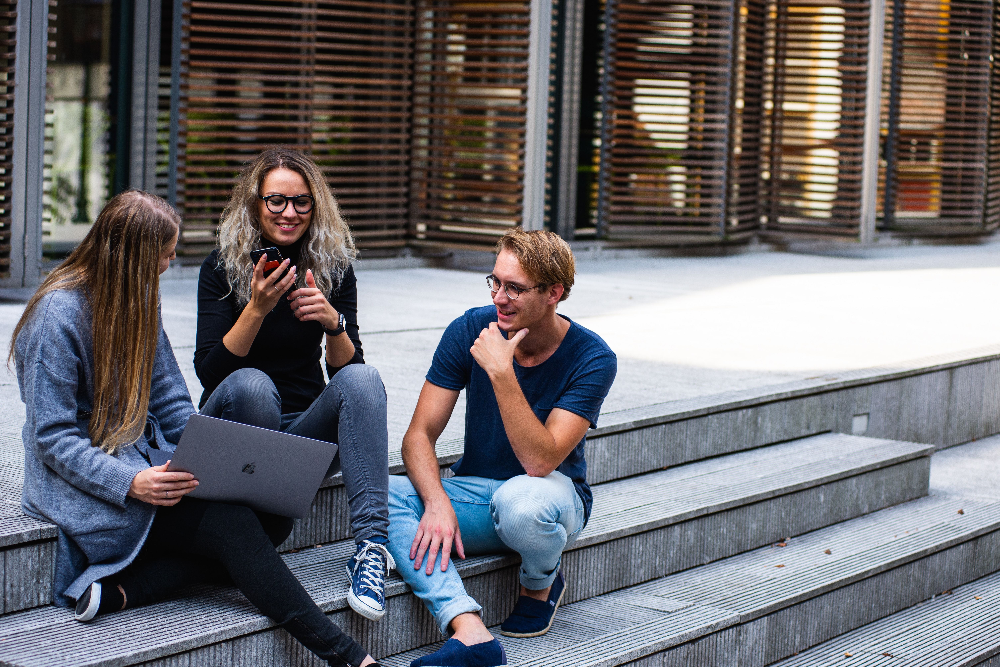

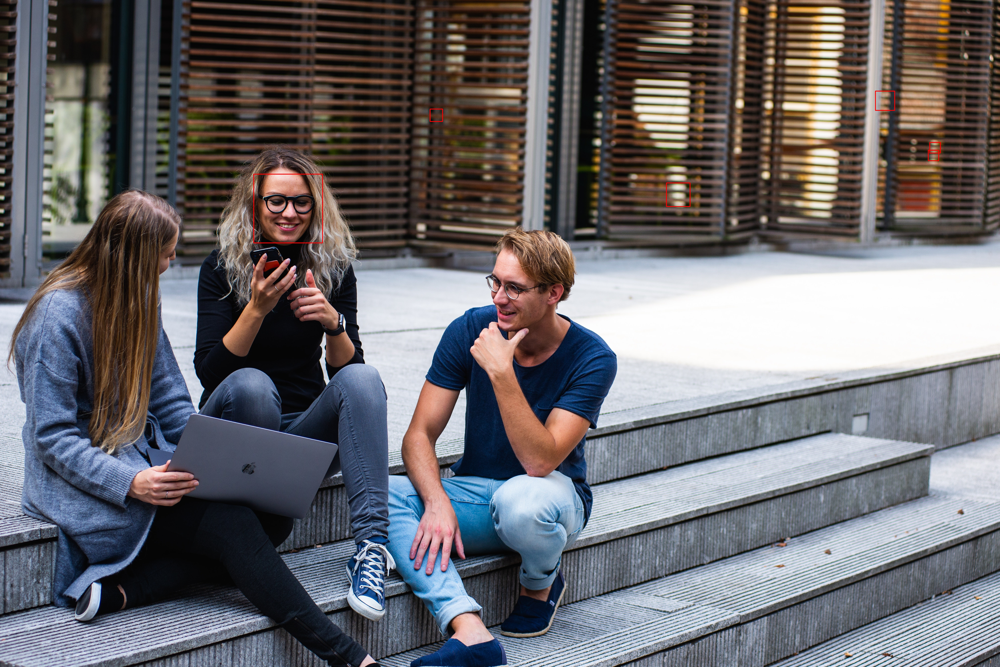